# Cell Rank - Trajectory Inference - Control Cohort

Goal: Mirror the trajectory analysis performed on the scCLEAN condition

1 - perform Cell Rank according to tutorials: https://cellrank.readthedocs.io/en/stable/index.html

2 - How many lineages are identified? 

2 - Do those lineages correlate with coronary vs pulmonary artery?

In [54]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import seaborn as sns
import scFates as scf

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo", dpi_save=600)
cr.settings.verbosity = 2


In [95]:
#open the filtered batch corrected anndata matrix 
#samples underwent QC individually, and then aggregated using 'pegasus aggregate_matrix' CLI
#See notebook for identification of Force Directed Layout Trajectory graphs
adata = sc.read_h5ad('VSMC/PC_miQC/PC_miQC_subtypes_Control_VSMC_all_patients.h5ad')
adata

AnnData object with n_obs × n_vars = 34890 × 16168
    obs: 'n_genes', 'n_counts', 'percent_mito', 'Channel', 'scale', 'louvain_labels', 'Tissue', 'doublet_score', 'pred_dbl', 'splice', 'value'
    var: 'featureid', 'n_cells', 'percent_cells', 'robust', 'highly_variable_features', 'mean', 'var', 'hvf_loess', 'hvf_rank'
    uns: 'PCs', '_attr2type', 'diffmap_evals', 'genome', 'louvain_labels_colors', 'louvain_resolution', 'modality', 'ncells', 'norm_count', 'pca', 'pca_features', 'stdzn_max_value', 'stdzn_mean', 'stdzn_std'
    obsm: 'X_diffmap', 'X_fle', 'X_pca', 'X_pca_harmony', 'X_phi', 'X_umap', 'diffmap_knn_distances', 'diffmap_knn_indices', 'pca_harmony_knn_distances', 'pca_harmony_knn_indices'
    varm: 'means', 'partial_sum'
    obsp: 'W_diffmap', 'W_pca_harmony'

In [33]:
adata.obs

,n_genes,n_counts,percent_mito,Channel,scale,louvain_labels,Tissue,doublet_score,pred_dbl,splice,value
barcodekey,,,,,,,,,,,
P1_Coronary-AAACCCAAGTCTAGAA,4458,22340,7.488809,P1_Coronary,4.476276,1,Coronary,0.001757,False,Yes,0
P1_Coronary-AAACCCACAGCACCCA,6294,40694,3.351845,P1_Coronary,2.457365,3,Coronary,0.001612,False,Yes,0
P1_Coronary-AAACCCAGTTCCGCTT,3739,14339,3.528837,P1_Coronary,6.974473,1,Coronary,0.001371,False,Yes,0
P1_Coronary-AAACGAAAGAAAGCGA,4753,26268,4.301812,P1_Coronary,3.807058,2,Coronary,0.002118,False,Yes,0
P1_Coronary-AAACGAAAGGTGGGTT,3288,13315,3.604957,P1_Coronary,7.510327,3,Coronary,0.001097,False,Yes,0
...,...,...,...,...,...,...,...,...,...,...,...
P4_Pulmonary-TTTGGTTAGACTTCGT,6644,61325,1.125153,P4_Pulmonary,1.630683,2,Pulmonary,0.001096,False,Yes,0
P4_Pulmonary-TTTGTTGAGCATCAAA,6367,40162,2.445097,P4_Pulmonary,2.490040,2,Pulmonary,0.001804,False,Yes,0
P4_Pulmonary-TTTGTTGAGGTCTGGA,5293,35347,3.010156,P4_Pulmonary,2.829254,1,Pulmonary,0.004670,False,Yes,0


In [34]:
#count the proper number of tissues to ensure the number of colors matches
adata.obs['Tissue'].value_counts()

Pulmonary    19297
Coronary     15593
Name: Tissue, dtype: int64

In [35]:
sc.tl.embedding_density(adata, basis='fle', groupby='Tissue')

/Users/jbezney/opt/anaconda3/envs/CELL_RANK/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
/Users/jbezney/opt/anaconda3/envs/CELL_RANK/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:444: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)


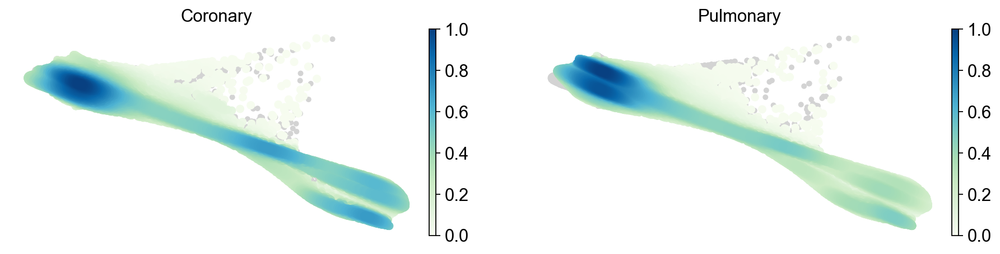

In [36]:
sc.set_figure_params(figsize=(6,3),frameon=False,dpi_save=300)
sc.pl.embedding_density(
    adata,
    basis='fle',
    key='fle_density_Tissue',
    color_map='GnBu',
    save='Density_Control_coronary_pulmonary.png')

In [37]:
adata.uns['Tissue_colors']= np.array(['#BA0900', '#809693'], dtype=object)

In [38]:
#need to use the harmony batch integrated matrix
sc.pp.neighbors(adata, use_rep='X_pca_harmony')


In [39]:
# see Cell Rank tutorial "CellRank beyond RNA velocity"
# we're copying our `.X` matrix into the layers because that's where `scv.tl.moments`
# expects to find counts for imputation
adata.layers["spliced"] = adata.X
adata.layers["unspliced"] = adata.X
#30 and 30 
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:57) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [40]:
from cellrank.tl.kernels import CytoTRACEKernel

ctk = CytoTRACEKernel(adata)

Computing CytoTRACE score with `16168` genes
Adding `adata.obs['ct_score']`
       `adata.obs['ct_pseudotime']`
       `adata.obs['ct_num_exp_genes']`
       `adata.var['ct_gene_corr']`
       `adata.var['ct_correlates']`
       `adata.uns['ct_params']`
    Finish (0:00:18)


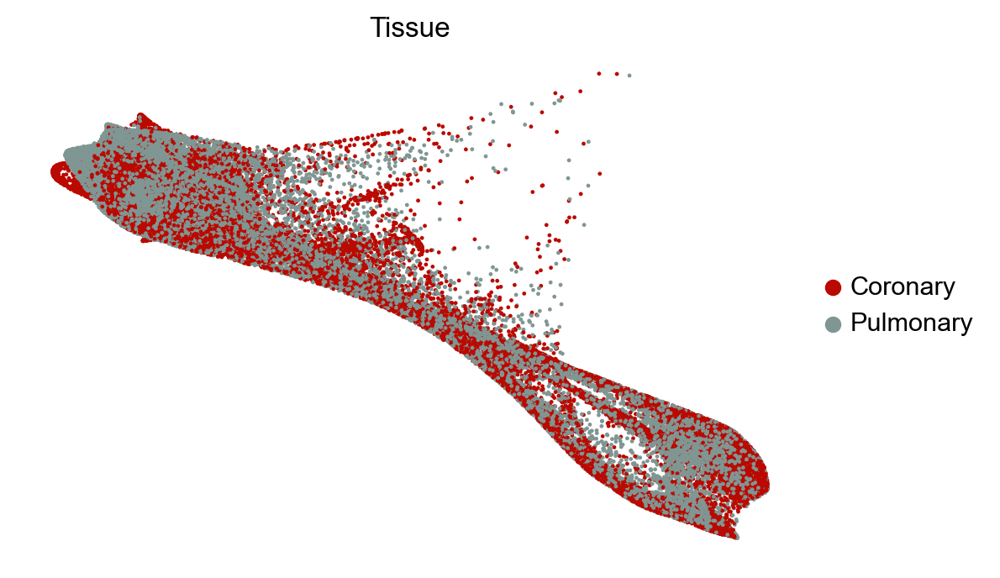

In [73]:
#plotting using scvelo functions
scv.pl.scatter(adata, basis="fle", color="Tissue", legend_loc="right")

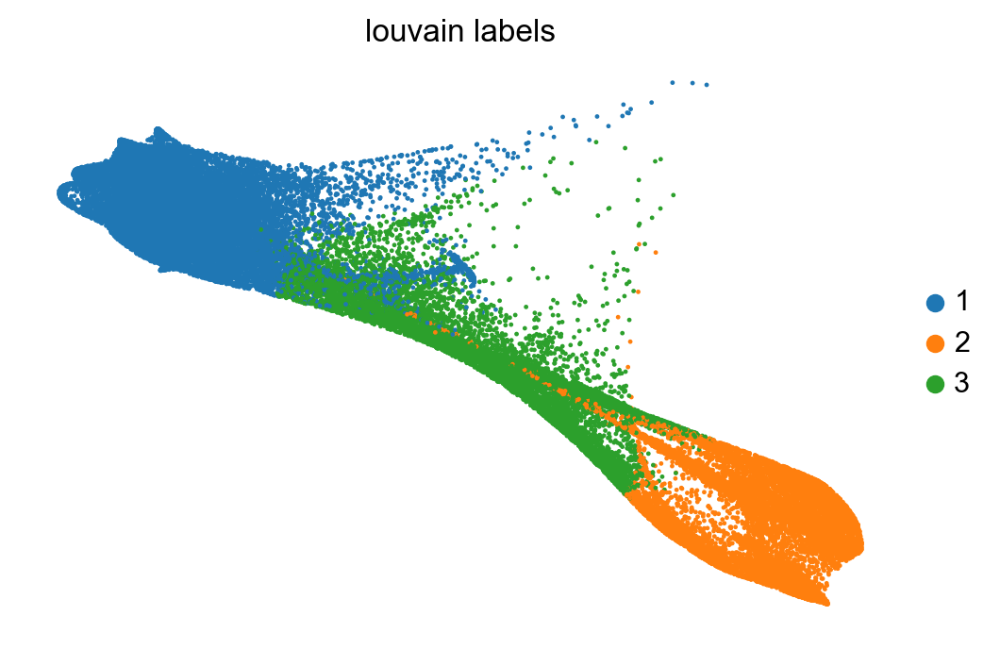

In [74]:
#plotting using scvelo functions
scv.pl.scatter(adata, basis="fle", c="louvain_labels", legend_loc="right")

saving figure to file VSMC/PC_Figures/Control_Pseudotime.png


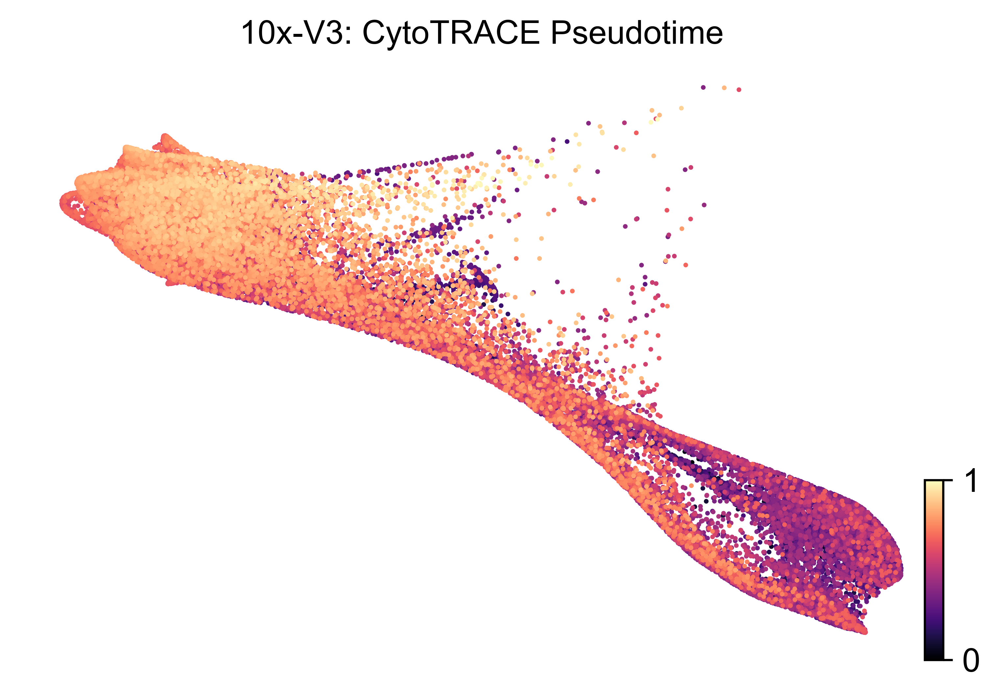

In [75]:
#plotting using scvelo functions
scv.pl.scatter(adata, basis="fle", c="ct_pseudotime", legend_loc="right",cmap='magma',
              title='10x-V3: CytoTRACE Pseudotime', dpi=300, save='VSMC/PC_Figures/Control_Pseudotime.png')

In [44]:
ctk.compute_transition_matrix(threshold_scheme="soft", nu=0.3)

Computing transition matrix based on `ct_pseudotime`


100%|███████████████████████████████████████████████████████████████████████████████████████████████| 34890/34890 [00:07<00:00, 4864.46cell/s]


    Finish (0:00:17)


<CytoTRACEKernel>

In [45]:
from cellrank.tl.estimators import GPCCA

g_fwd = GPCCA(ctk)
print(g_fwd)

GPCCA[n=34890, kernel=<CytoTRACEKernel[dnorm=False, scheme=soft, b=10.0, nu=0.3]>]


Computing Schur decomposition
Mat Object: 1 MPI processes
  type: seqdense
9.9999999999999978e-01 1.5104703446893388e-03 -1.0589381352350191e-03 2.7950273950795579e-02 5.7465896995287716e-03 -2.6981007403120198e-02 -1.3253115379381099e-02 -6.8190724781176497e-04 -2.6218359832608572e-02 -3.3066354637139618e-02 -5.6385359598725114e-03 1.2441219204278382e-02 1.7873711968797199e-02 -2.7108550577416082e-03 6.9743318436813308e-03 -2.4262715375852124e-02 -7.0706238090262205e-02 -2.5899948554389304e-02 -5.7455826297393542e-02 -9.5251526184787544e-04 6.2442456244687344e-03 -1.7232947388803023e-02 8.3140904450904451e-03 1.0946223742786766e-02 -2.1585266902328183e-02 1.2795137726302936e-02 2.4070688306005745e-02 -2.7892400598665958e-02 
0.0000000000000000e+00 9.9627336204564065e-01 5.4521970128935350e-03 9.8249454254520645e-04 -2.6367971432676867e-02 -1.0192294136377173e-02 2.4376187853096100e-04 4.5190890936599318e-03 -4.6776283811514763e-03 -1.9275232991329244e-02 6.5829359852476732e-03 -9.0155

Adding `adata.uns['eigendecomposition_fwd']`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:02)


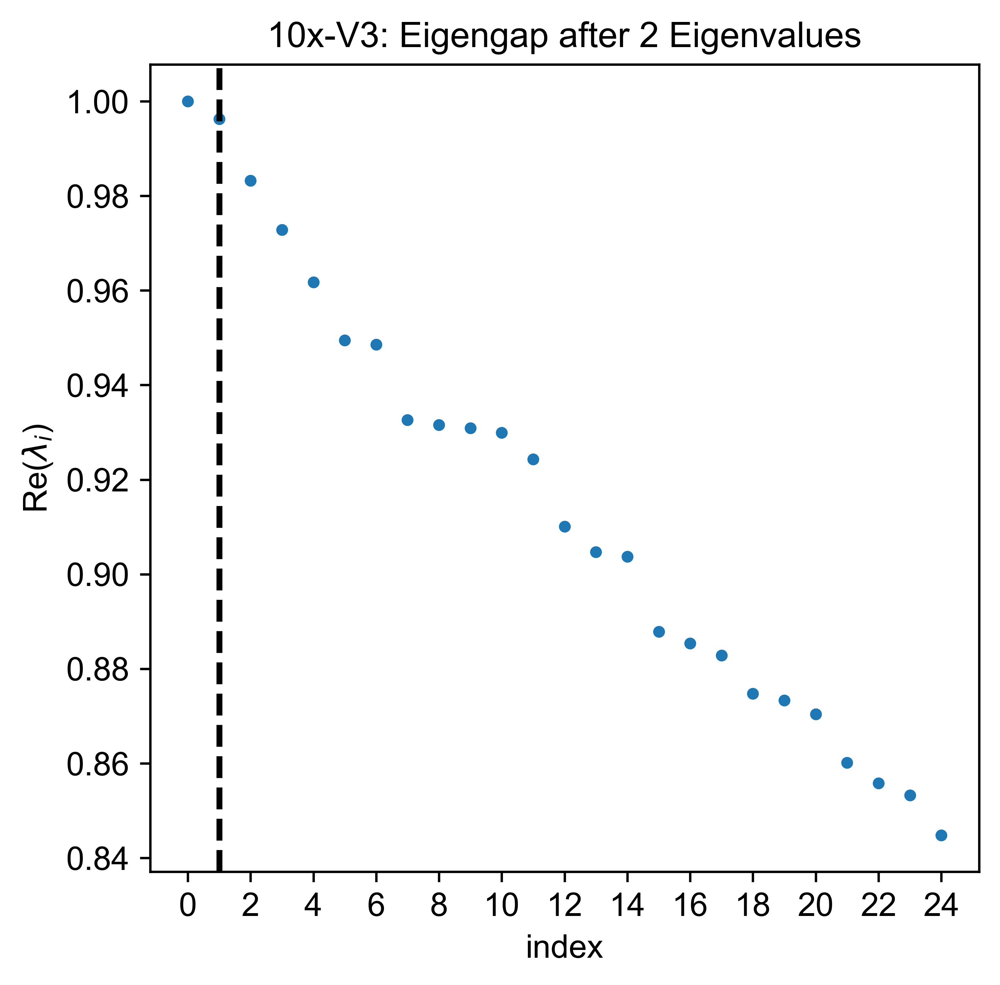

In [72]:
g_fwd.compute_schur(n_components=25, alpha=0.2)
g_fwd.plot_spectrum(real_only=True, title='10x-V3: Eigengap after 2 Eigenvalues', dpi=300,show_all_xticks=False, 
                   save='VSMC/Figures/Schur_spectrum_control.png')

According to the gap in the real component of the eigenvalues, two mcarostates should be computed

Computing `2` macrostates
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)


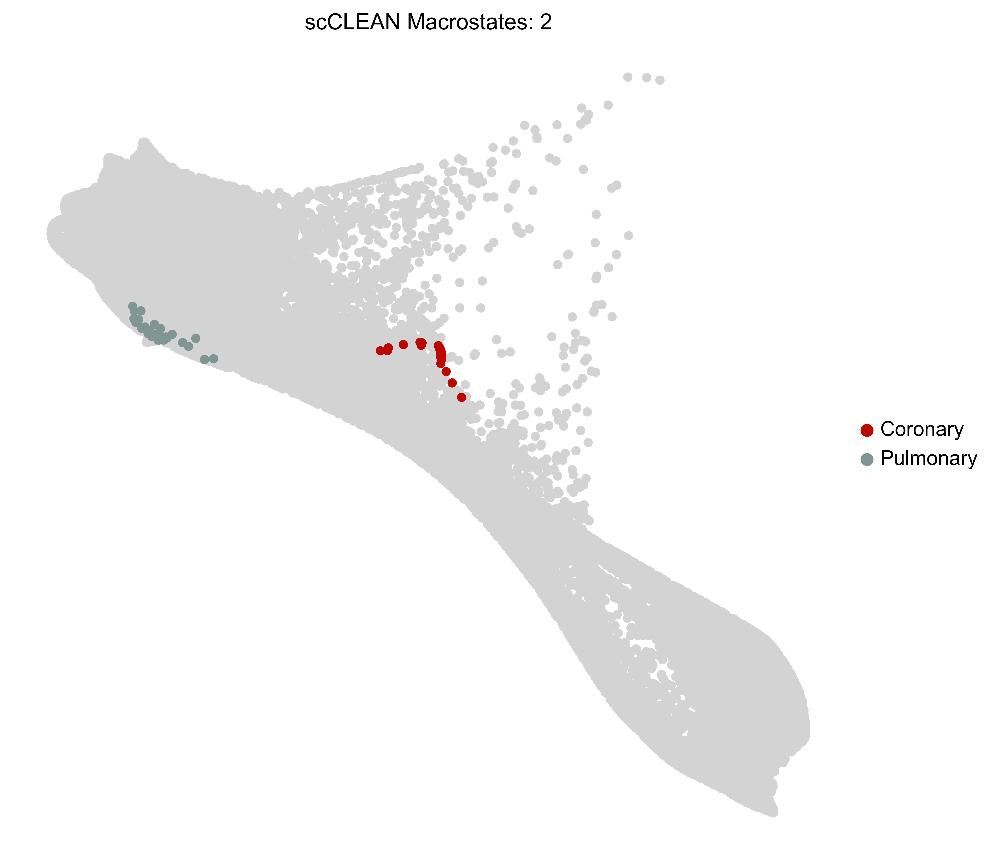

In [98]:
#cluster_key tries to associated the names of macrostates with cluster labels, 
#or in this case, tissue origin
g_fwd.compute_macrostates(n_states=2, cluster_key="Tissue")
g_fwd.plot_macrostates(
    discrete=True, legend_loc="right", size=100, basis="fle", title='scCLEAN Macrostates: 2',
    figsize=[8,8], dpi=400)

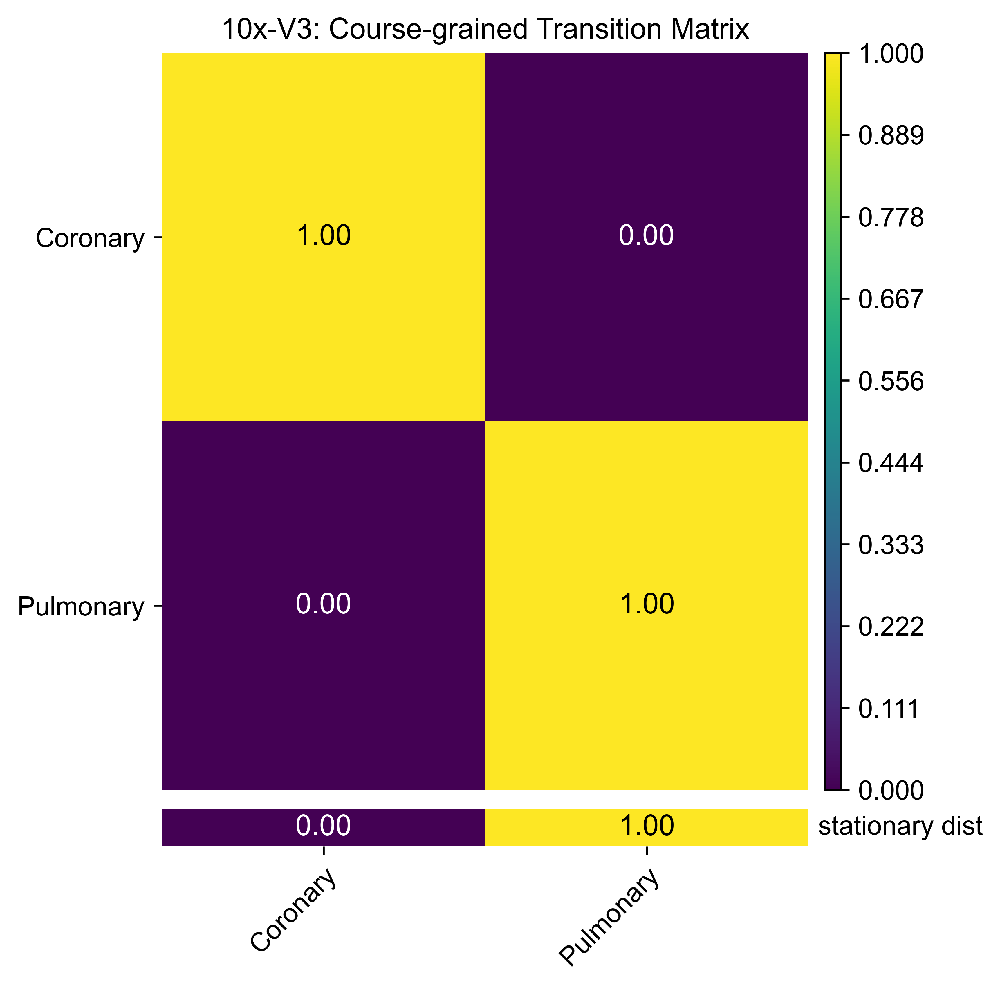

In [99]:
#the course grained transition matrix is stable at 1
#that means there is a clear defined seperation of terminal states
g_fwd.plot_coarse_T(figsize=[5,6], title='10x-V3: Course-grained Transition Matrix', 
                  save='VSMC/PC_Figures/Course_Grained_Control.png', dpi=300)

the higher the stationary distance the more terminal end point in pseudotime

Stationary distance is the stationary distirbution of the transition matrix

The smaller the value the shorter the differentiation path  

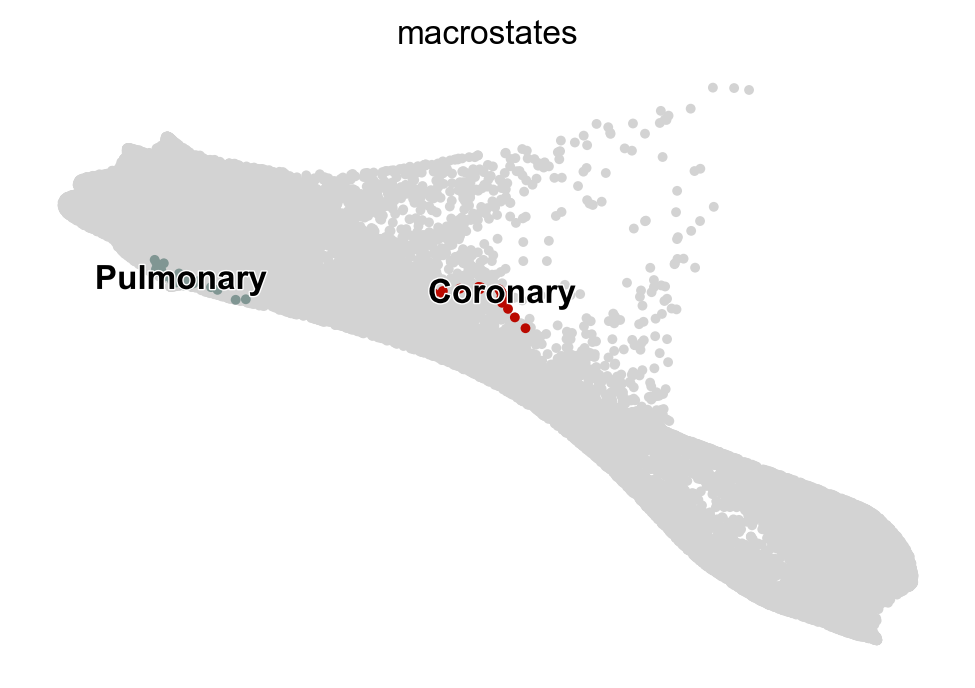

In [100]:
g_fwd.plot_macrostates(discrete=True, same_plot=True, basis="fle", size=50)

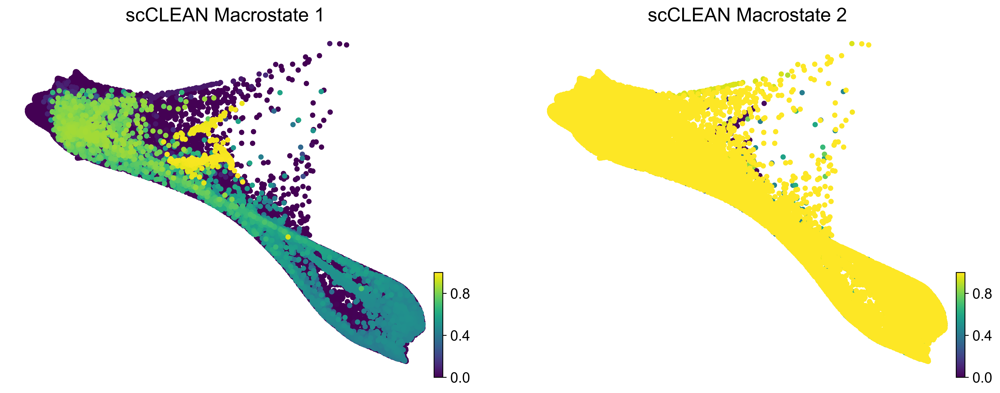

In [101]:
g_fwd.plot_macrostates(same_plot=False, basis='fle', 
                       title=['scCLEAN Macrostate 1','scCLEAN Macrostate 2'],
    figsize=[8,6], size=100, fontsize=18,  dpi=400)

In [102]:
#add a new observale into adata.obs defining the terminal states
g_fwd.set_terminal_states_from_macrostates(names=['Coronary',
                                                  'Pulmonary'])


Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


In [103]:
g_fwd.rename_terminal_states({'Pulmonary':'Lineage_1', 'Coronary':'Lineage_2'})

Computing absorption probabilities


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.49/s]

Adding `adata.obsm['to_terminal_states']`
       `adata.obsm['absorption_times_fwd']`
       `.absorption_probabilities`
       `.absorption_times`
    Finish (0:00:01)


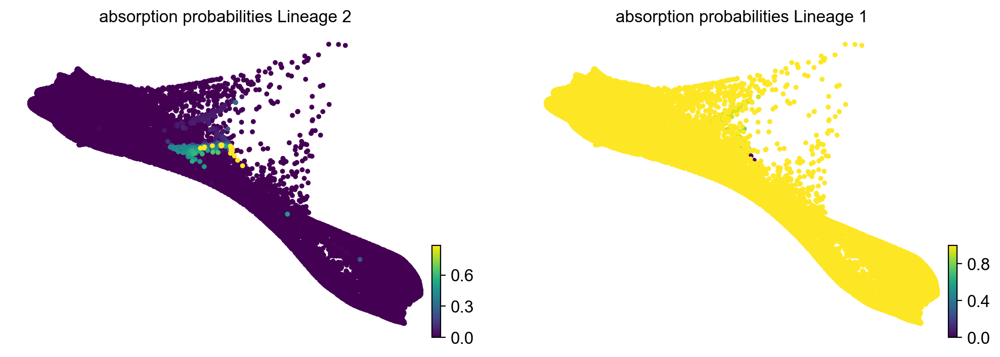

In [104]:
#this computes the fate probabilities toward those terminal states for every cell
g_fwd.compute_absorption_probabilities( time_to_absorption='all')
g_fwd.plot_absorption_probabilities(same_plot=False, size=50, basis="fle")

Now it makes sense why the coronary macrostate had a stationary distance of 0

There are only a handful of cells differentiating toward this terminal state

99% of cells are transitioning toward macrostate associated with lineage 2

In [83]:
#check the probabilities of each cell moving to each fate 
lineage = pd.DataFrame(adata.obsm['to_terminal_states'])
lineage['Lineage_2'] = lineage[0]>0.5
lineage['Lineage_1'] = lineage[1]>0.5
lineage

,0,1,Lineage_2,Lineage_1
0,1.323540e-12,0.999660,False,True
1,2.114814e-12,0.999660,False,True
2,9.830771e-13,0.999660,False,True
3,4.422072e-12,0.999660,False,True
4,1.075595e-12,0.999660,False,True
...,...,...,...,...
34885,8.360096e-10,0.999660,False,True
34886,5.840236e-07,0.999660,False,True
34887,1.398509e-09,0.999660,False,True
34888,1.321043e-09,0.999660,False,True


In [84]:
#only 50 cells are differentiation toward lineage 1
lineage['Lineage_2'].value_counts()

False    34840
True        50
Name: Lineage_2, dtype: int64

In [97]:
adata.obs['Tissue'].value_counts()

Pulmonary    19297
Coronary     15593
Name: Tissue, dtype: int64

saving figure to file VSMC/PC_Figures/Control_absorption_probabilities.png


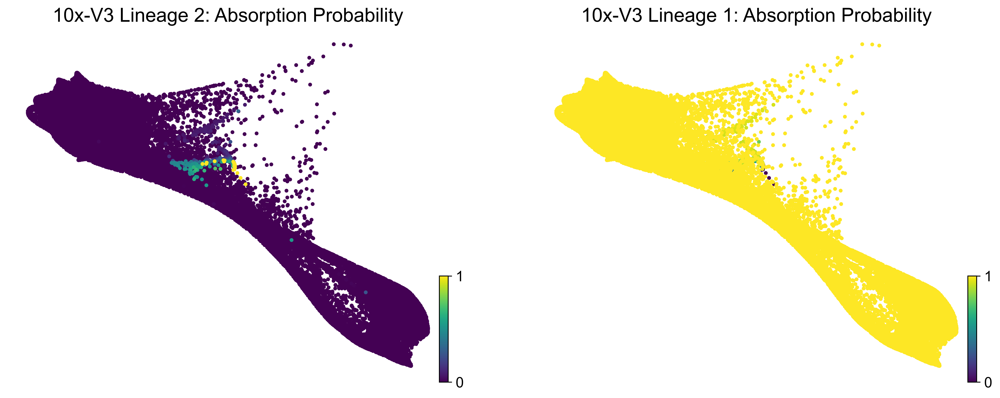

In [105]:
g_fwd.plot_absorption_probabilities(same_plot=False, size=50, 
                                    basis="fle", rescale_color=[0,1.001],
                                   title=['10x-V3 Lineage 2: Absorption Probability','10x-V3 Lineage 1: Absorption Probability'],
    figsize=[8,6], fontsize=18,  dpi=400, save='VSMC/PC_Figures/Control_absorption_probabilities.png')

In [85]:
#use any kwargs from https://scvelo.readthedocs.io/scvelo.pl.scatter/#scvelo.pl.scatter
g_fwd.plot_absorption_probabilities(same_plot=False, color='Tissue', mode='time', time_key='ct_pseudotime', 
                                    size=25, basis="fle", alpha=0.5, figsize=[8,8], fontsize=18,  dpi=400,
                                    xlabel='Pseudotime', ylabel='Probability',xlim=[-0.05,1.05],
                                   title=['10x-V3 Lineage 2: Absorption Probability','10x-V3 Lineage 1: Absorption Probability'],
                                   save='VSMC/PC_Figures/Control_probability_Coronary_Pulmonary.png')

saving figure to file VSMC/PC_Figures/Control_probability_Coronary_Pulmonary.png


Similar to scCLEAN condition, it is identifying that one lineage is capturing features specific to coronary

Except the amount of cells it can identify as probably differentiating toward that lineage is negligible

saving figure to file VSMC/PC_Figures/Control_1lineage_Terminal_States.png


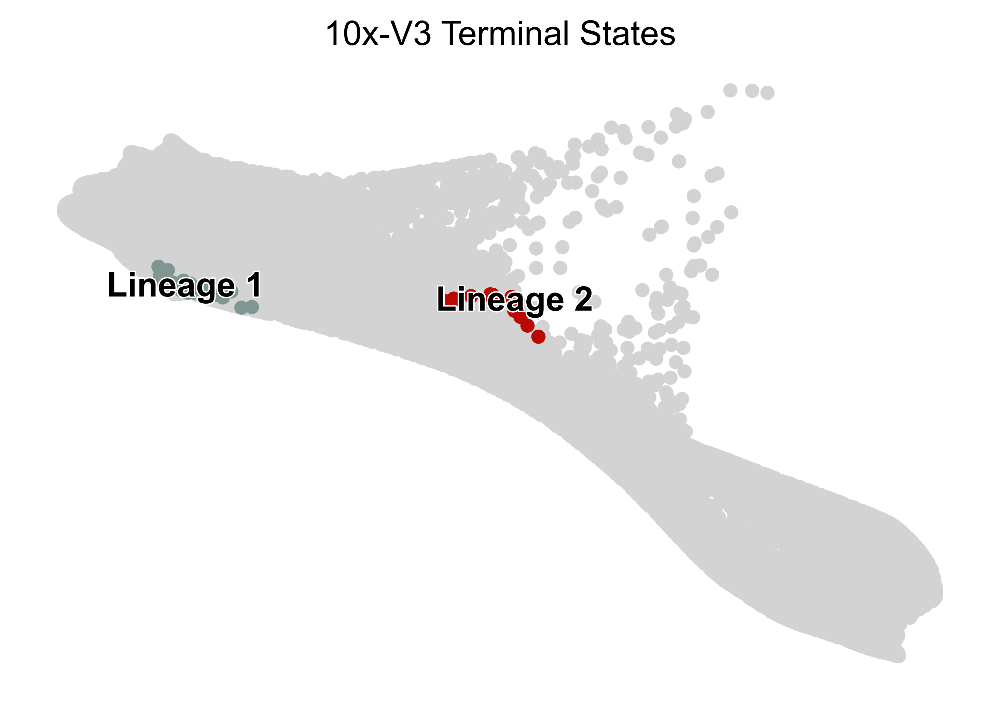

In [86]:
scv.pl.scatter(adata, basis="fle", c="terminal_states", size=100, legend_loc='on data',
               title='10x-V3 Terminal States', dpi=300, save='VSMC/PC_Figures/Control_1lineage_Terminal_States.png')

# AUC - Classification

What is the classification potential for these two lineage distinctions?

In [87]:
#read terminal state probabilities into dataframe to determine correlation
terminal_df = pd.DataFrame(adata.obsm['to_terminal_states'])
terminal_df = terminal_df.rename(columns={0: "Lineage 1", 1: "Lineage 2"})
terminal_df['barcode']=adata.obs.index.values
terminal_df = terminal_df.set_index('barcode')
terminal_df['Origin']=adata.obs['Tissue']
terminal_df

,Lineage 1,Lineage 2,Origin
barcode,,,
P1_Coronary-AAACCCAAGTCTAGAA,1.323540e-12,0.999660,Coronary
P1_Coronary-AAACCCACAGCACCCA,2.114814e-12,0.999660,Coronary
P1_Coronary-AAACCCAGTTCCGCTT,9.830771e-13,0.999660,Coronary
P1_Coronary-AAACGAAAGAAAGCGA,4.422072e-12,0.999660,Coronary
P1_Coronary-AAACGAAAGGTGGGTT,1.075595e-12,0.999660,Coronary
...,...,...,...
P4_Pulmonary-TTTGGTTAGACTTCGT,8.360096e-10,0.999660,Pulmonary
P4_Pulmonary-TTTGTTGAGCATCAAA,5.840236e-07,0.999660,Pulmonary
P4_Pulmonary-TTTGTTGAGGTCTGGA,1.398509e-09,0.999660,Pulmonary


In [88]:
adata.obs['Pulmonary_lin_abs_prob']=terminal_df['Lineage 1']
adata.obs['Coronary_lin_abs_prob']=terminal_df['Lineage 2']

In [89]:
#change the identity state into a binary filter 
terminal_df['P_identity'] = 0
terminal_df.loc[terminal_df['Origin'] == 'Pulmonary', 'P_identity'] = 1

terminal_df['C_identity'] = 0
terminal_df.loc[terminal_df['Origin'] == 'Coronary', 'C_identity'] = 1

#create new dataframe to generate the heatmap
heat = pd.DataFrame()
heat['Lineage 1'] = terminal_df['Lineage 2']
heat['Pulmonary Identity'] = terminal_df['P_identity']
heat['Lineage 2'] = terminal_df['Lineage 1']
heat['Coronary Identity'] = terminal_df['C_identity']
heat = heat.reset_index(drop=True)
heat

,Lineage 1,Pulmonary Identity,Lineage 2,Coronary Identity
0,0.999660,0,1.323540e-12,1
1,0.999660,0,2.114814e-12,1
2,0.999660,0,9.830771e-13,1
3,0.999660,0,4.422072e-12,1
4,0.999660,0,1.075595e-12,1
...,...,...,...,...
34885,0.999660,1,8.360096e-10,0
34886,0.999660,1,5.840236e-07,0
34887,0.999660,1,1.398509e-09,0
34888,0.999660,1,1.321043e-09,0


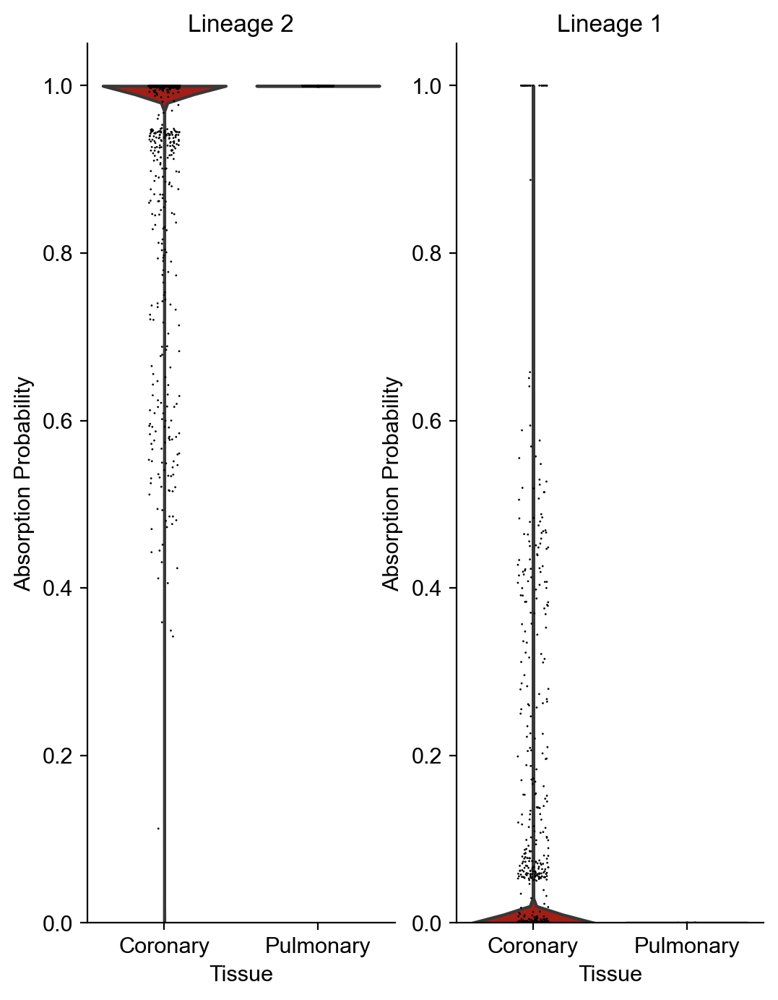

In [90]:
#plot the lineage probability compressed along the pseudotime x-axis
fig = plt.figure()

fig.set_figheight(8)
fig.set_figwidth(6)
ax = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

ax = sc.pl.violin(adata, 'Coronary_lin_abs_prob', groupby='Tissue', stripplot=True, jitter=0.1, show=False, ax=ax)
ax.set_title('Lineage 2')
ax.set_ylabel('Absorption Probability')
ax.set_ylim(0, 1.05)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax2 = sc.pl.violin(adata, 'Pulmonary_lin_abs_prob', groupby='Tissue', stripplot=True, jitter=0.1, show=False, ax=ax2)
ax2.set_title('Lineage 1')
ax2.set_ylabel('Absorption Probability')
ax2.set_ylim(0, 1.05)

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

fig.savefig('VSMC/PC_Figures/Control_Violin_Lineages.png', dpi=400)

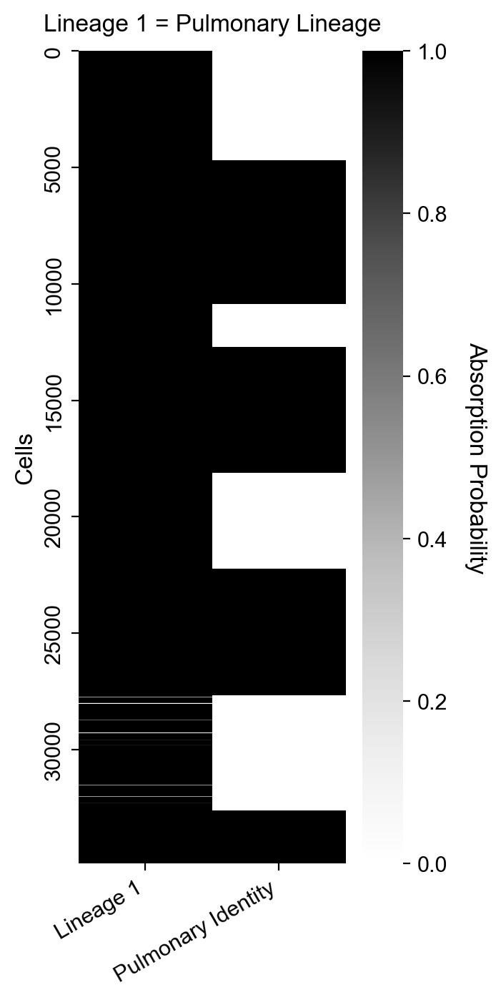

In [91]:
lineage2 = heat[['Lineage 1','Pulmonary Identity']]

fig,ax = plt.subplots(figsize=(3,8))
ax = sns.heatmap(lineage2, cmap='Greys', yticklabels = 5000, 
                 )

plt.xticks(rotation = 30)
# set y-axis label
ax.set_ylabel("Cells",fontsize=12)
ax.figure.axes[-1].set_ylabel('Absorption Probability', size=12, rotation=270, labelpad=20)
fig.autofmt_xdate()

plt.title('Lineage 1 = Pulmonary Lineage', y=1.01, fontsize=12)

# save the plot as a file
fig.savefig('VSMC/PC_Figures/Control_Heatmap_Pulmonary.jpg', dpi=300, bbox_inches='tight')

plt.show()

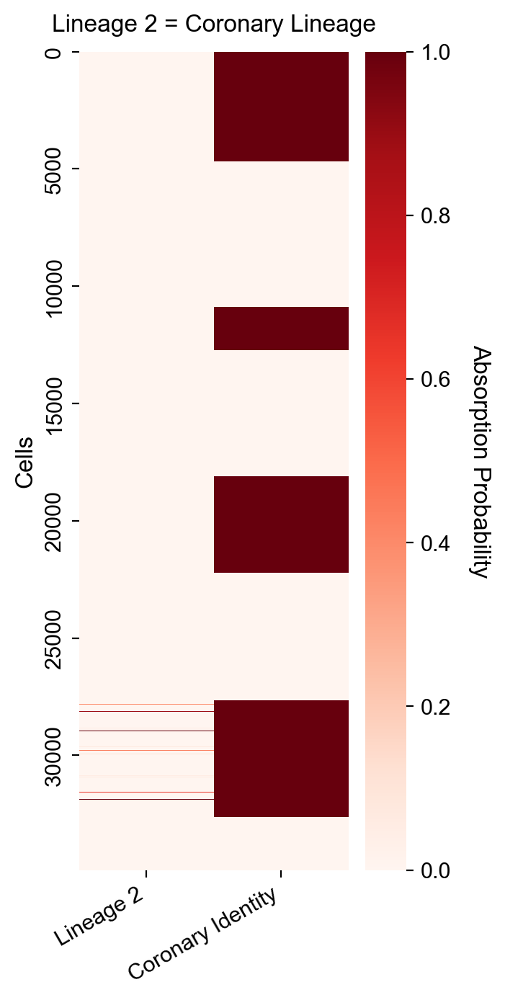

In [92]:
lineage1 = heat[['Lineage 2','Coronary Identity']]

fig,ax = plt.subplots(figsize=(3,8))
ax = sns.heatmap(lineage1, cmap='Reds', yticklabels = 5000, 
                 )

plt.xticks(rotation = 30)
# set y-axis label
ax.set_ylabel("Cells",fontsize=12)
ax.figure.axes[-1].set_ylabel('Absorption Probability', size=12, rotation=270, labelpad=20)
fig.autofmt_xdate()

plt.title('Lineage 2 = Coronary Lineage', y=1.01, fontsize=12)

# save the plot as a file
fig.savefig('VSMC/PC_Figures/Control_Heatmap_Coronary.jpg', dpi=300, bbox_inches='tight')

plt.show()

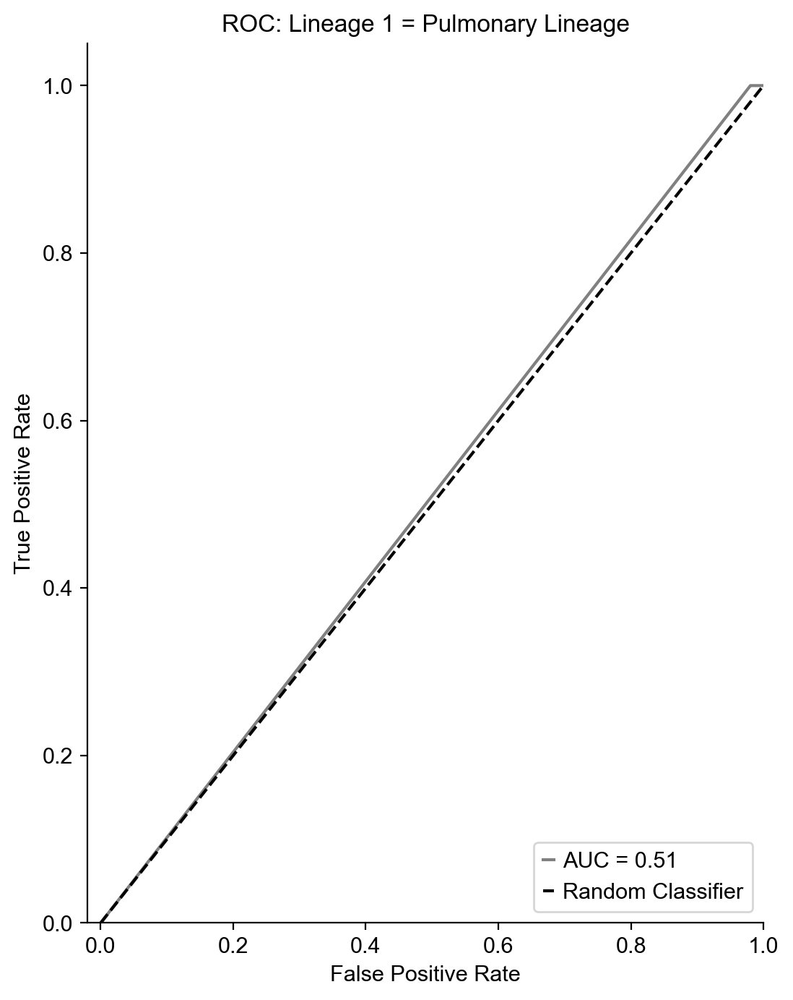

In [93]:

#this is for the pulmonary lineage alone exclusively 
score = np.array(terminal_df['Lineage 2'])
y = np.array(terminal_df['P_identity'])

# false positive rate
fpr = []
# true positive rate
tpr = []
# Iterate thresholds from 0.0, 0.01, ... 1.0
thresholds = np.arange(0.0, 1.01, .01)

# get number of positive and negative examples in the dataset
P = sum(y)
N = len(y) - P

# iterate through all thresholds and determine fraction of true positives
# and false positives found at this threshold
for thresh in thresholds:
    FP=0
    TP=0
    for i in range(len(score)):
        if (score[i] > thresh):
            if y[i] == 1:
                TP = TP + 1
            if y[i] == 0:
                FP = FP + 1
    fpr.append(FP/float(N))
    tpr.append(TP/float(P))

import sklearn.metrics as metrics
roc_auc = metrics.auc(fpr, tpr)

fig, ax = plt.subplots()
fig.set_figheight(8)
fig.set_figwidth(6)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


plt.title('ROC: Lineage 1 = Pulmonary Lineage')
plt.plot(fpr, tpr, 'gray', label = 'AUC = %0.2f' % roc_auc)
plt.plot([0, 1], [0, 1],'black',linestyle='dashed', label = 'Random Classifier')
plt.legend(loc = 'lower right')
plt.xlim([-0.02, 1])
plt.ylim([0, 1.05])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.savefig('VSMC/PC_Figures/Control_ROC_pulmonary_lineage.png', dpi=300, bbox_inches='tight')

plt.show()

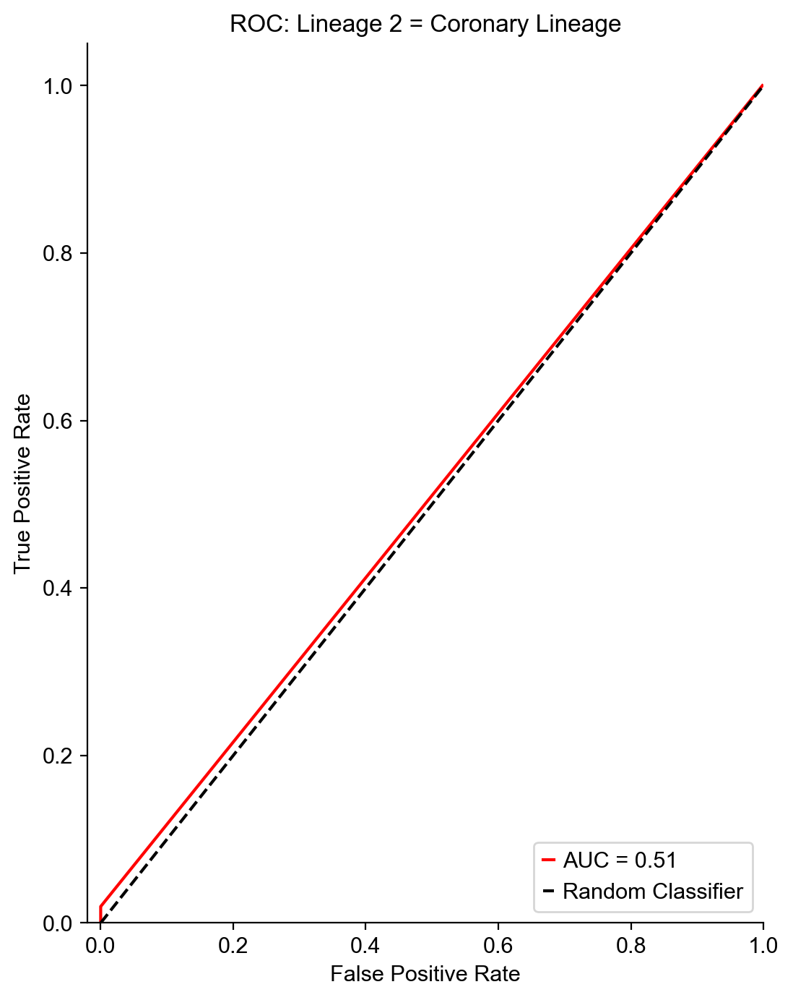

In [94]:
#this is for the coronary lineage alone exclusively 
score = np.array(terminal_df['Lineage 1'])
y = np.array(terminal_df['C_identity'])

# false positive rate
fpr = []
# true positive rate
tpr = []
# Iterate thresholds from 0.0, 0.01, ... 1.0
thresholds = np.arange(0.0, 1.01, .01)

# get number of positive and negative examples in the dataset
P = sum(y)
N = len(y) - P

# iterate through all thresholds and determine fraction of true positives
# and false positives found at this threshold
for thresh in thresholds:
    FP=0
    TP=0
    for i in range(len(score)):
        if (score[i] > thresh):
            if y[i] == 1:
                TP = TP + 1
            if y[i] == 0:
                FP = FP + 1
    fpr.append(FP/float(N))
    tpr.append(TP/float(P))
    
import sklearn.metrics as metrics
roc_auc = metrics.auc(fpr, tpr)

fig, ax = plt.subplots()
fig.set_figheight(8)
fig.set_figwidth(6)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.title('ROC: Lineage 2 = Coronary Lineage')
plt.plot(fpr, tpr, 'red', label = 'AUC = %0.2f' % roc_auc)
plt.plot([0, 1], [0, 1],'black',linestyle='dashed', label = 'Random Classifier')
plt.legend(loc = 'lower right')
plt.xlim([-0.02, 1])
plt.ylim([0, 1.05])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.savefig('VSMC/PC_Figures/Control_ROC_coronary_lineage.png', dpi=300, bbox_inches='tight')

plt.show()

Clearly, there is no ability to classify lineage association with tissue identity 

This was predicted because Lineage 1 had stationary distance along the Markov transition matrix of 0 

Furthermore, less than 1% of cells had an absorption probability associated with lineage 1 

Consequently, macrostates and lineages will be re-calculated

For 1 macrostate, stationary distribution is computed
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_fwd']`
       `.eigendecomposition`
    Finish (0:00:02)
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:02)


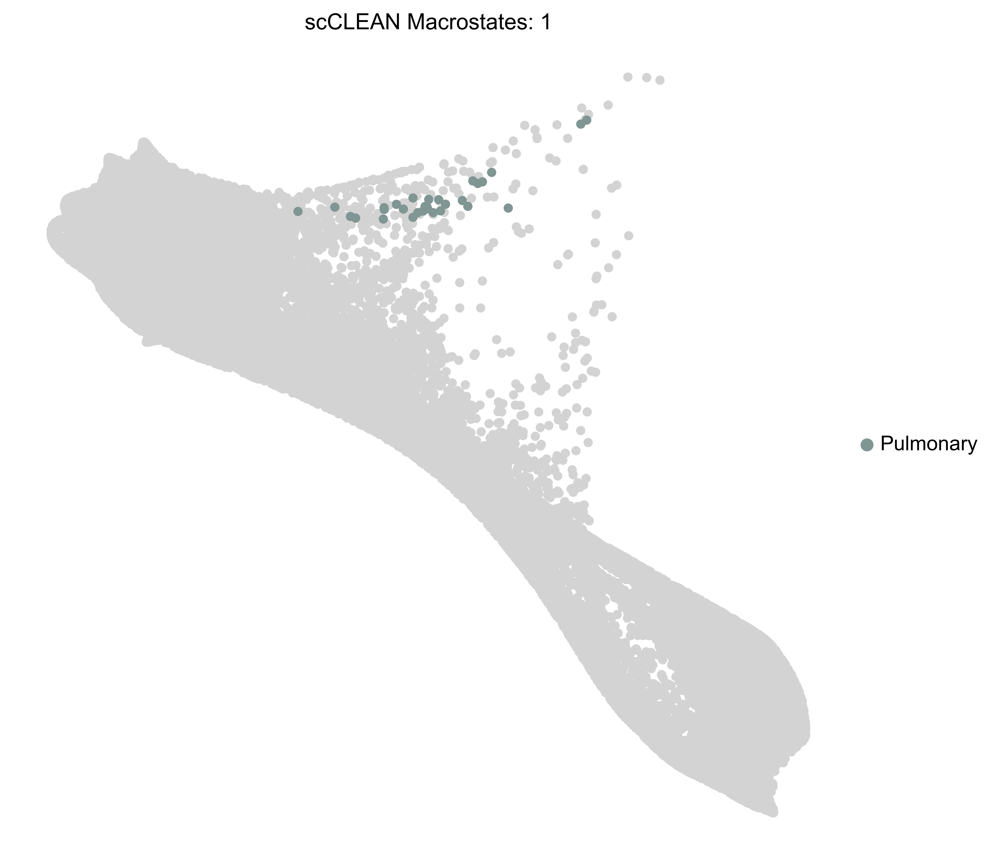

In [68]:
g_fwd.compute_macrostates(n_states=1, cluster_key="Tissue")
g_fwd.plot_macrostates(
    discrete=True, legend_loc="right", size=100, basis="fle", title='scCLEAN Macrostates: 1',
    figsize=[8,8], dpi=400)

In [69]:
g_fwd.set_terminal_states_from_macrostates(names=['Pulmonary'])
g_fwd.rename_terminal_states({'Pulmonary':'Lineage_1'})

Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`


Computing absorption probabilities


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.00/s]

Adding `adata.obsm['to_terminal_states']`
       `adata.obsm['absorption_times_fwd']`
       `.absorption_probabilities`
       `.absorption_times`
    Finish (0:00:00)


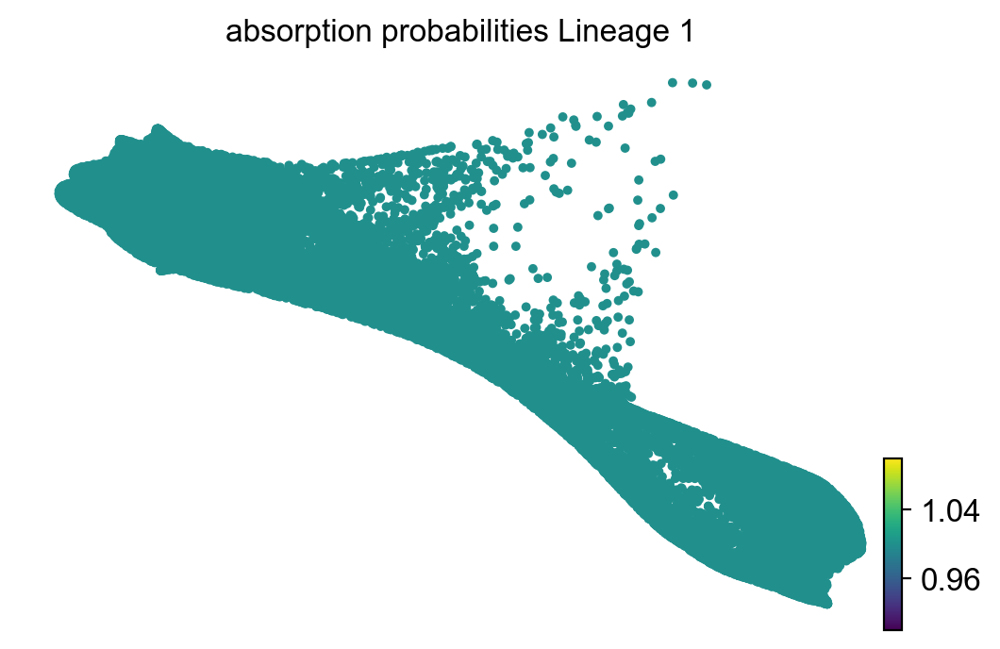

In [70]:
g_fwd.compute_absorption_probabilities( time_to_absorption='all')
g_fwd.plot_absorption_probabilities(same_plot=False, size=50, basis="fle")

saving figure to file VSMC/PC_Figures/Control_1lineage_Terminal_States.png


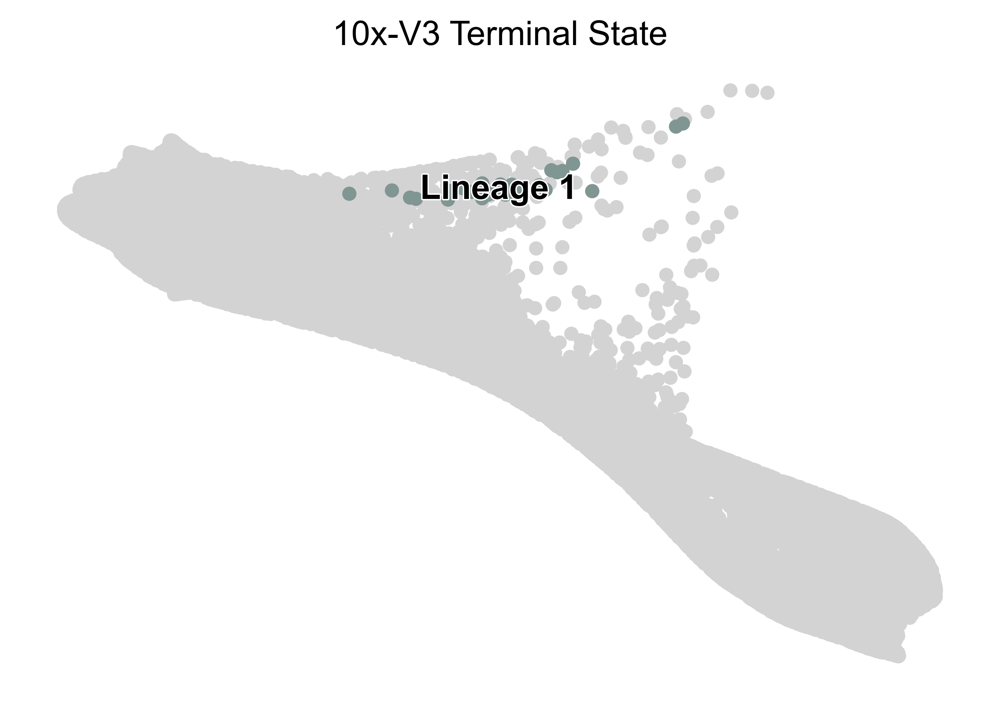

In [71]:
scv.pl.scatter(adata, basis="fle", c="terminal_states", size=100, legend_loc='on data',
               title='10x-V3 Terminal State', dpi=300, save='VSMC/PC_Figures/Control_1lineage_Terminal_States.png')